## Web service for model prediction

In [3]:
# Start the server
!python scripts/api.py

^C


Download the bert model from - https://huggingface.co/google-bert/bert-base-uncased/tree/main

Download these files of the model --> config.json, pytorch_model.bin, tokenizer.json,tokenizer_config.json, vocab.txt

And save it in models folder.(models --> bert_model[config.json, pytorch_model.bin, tokenizer.json,tokenizer_config.json, vocab.txt])

## Test the endpoint

In [6]:
import requests
import json

model_endpoint = 'http://localhost:8000/predict'

input_sentence = "Abbreviations: GEMS, Global Enteric Multicenter Study; VIP, ventilated improved pit."
# input_sentence = "We developed a variant of gene set enrichment analysis ( GSEA ) to determine whether a genetic pathway shows evidence for age regulation [ 23 ]."
# Define the input text
text_request = {
    "text": input_sentence
}

# Make the POST request to the prediction endpoint
response = requests.post(model_endpoint, json=text_request)

# Print the response
try:
    response_json = response.json()
    print("Response JSON:")
    for item in response_json['result']:
        print(f"Label: {item['label']}, Word: {item['word']}, Score: {item['score']:.4f}")
except json.JSONDecodeError as e:
    print(f"Error decoding response: {e}")
    print(f"Raw response text: {response.text}")


Response JSON:
Label: LF, Word: gene set enrichment analysis, Score: 0.9966
Label: AC, Word: gsea, Score: 0.9988


## Acessing the log file - service.log

In [8]:
import os

log_file_path = os.path.join("logs", "service.log")

def read_logs(file_path):
    if os.path.exists(file_path):
        with open(file_path, 'r') as log_file:
            logs = log_file.readlines()
            for log in logs:
                print(log.strip())
    else:
        print(f"Log file not found at path: {file_path}")

read_logs(log_file_path)

2024-05-23 16:04:05,481 Service started successfully in 0:00:01.220553
2024-05-23 16:04:05,486 Using proactor: IocpProactor
2024-05-23 16:06:24,287 Predicting for the input text: Abbreviations: GEMS, Global Enteric Multicenter Study; VIP, ventilated improved pit.
2024-05-23 16:06:24,287 Predicting for Abbreviations: GEMS, Global Enteric Multicenter Study; VIP, ventilated improved pit.
2024-05-23 16:06:24,694 Predicting result: [{'entity_group': 'AC', 'score': 0.94932795, 'word': 'gems', 'start': 15, 'end': 19}, {'entity_group': 'LF', 'score': 0.90420926, 'word': 'global enteric multicenter study', 'start': 21, 'end': 53}, {'entity_group': 'AC', 'score': 0.94670266, 'word': 'vip', 'start': 55, 'end': 58}, {'entity_group': 'LF', 'score': 0.9646659, 'word': 'ventilated improved pit', 'start': 60, 'end': 83}]
2024-05-23 16:10:49,321 Predicting for the input text: We developed a variant of gene set enrichment analysis ( GSEA ) to determine whether a genetic pathway shows evidence for age re

## Stress test

In [4]:
!locust -f scripts/stress_test.py --web-port 8090 --csv=locust_output


^C


Go on - http://localhost:8090 to perform stress testing.

In [7]:
import pandas as pd

# Define the CSV file paths (modify these if you used a different prefix)
stats_history_csv_path = 'locust_output_stats_history.csv'
failures_csv_path = 'locust_output_failures.csv'
stats_csv_path = 'locust_output_stats.csv'

# Function to read and print a CSV file
def print_csv_content(file_path):
    try:
        df = pd.read_csv(file_path)
        print(f"\nContent of {file_path}:\n")
        print(df.to_string(index=False))
    except FileNotFoundError:
        print(f"File not found: {file_path}")
    except pd.errors.EmptyDataError:
        print(f"No data in file: {file_path}")

# Print the content of the CSV files

print_csv_content(failures_csv_path)
print_csv_content(stats_csv_path)
print_csv_content(stats_history_csv_path)



Content of locust_output_failures.csv:

Empty DataFrame
Columns: [Method, Name, Error, Occurrences]
Index: []

Content of locust_output_stats.csv:

Type       Name  Request Count  Failure Count  Median Response Time  Average Response Time  Min Response Time  Max Response Time  Average Content Size  Requests/s  Failures/s  50%  66%  75%  80%   90%   95%   98%   99%  99.9%  99.99%  100%
POST   /predict            120              0                6700.0            7254.105928          4564.0408         12975.0004                 282.0    5.683073         0.0 6800 7300 8600 9700 10000 11000 12000 13000  13000   13000 13000
 NaN Aggregated            120              0                6700.0            7254.105928          4564.0408         12975.0004                 282.0    5.683073         0.0 6800 7300 8600 9700 10000 11000 12000 13000  13000   13000 13000

Content of locust_output_stats_history.csv:

 Timestamp  User Count  Type       Name  Requests/s  Failures/s     50%     66%     7

## CI/CD pipeline

In [1]:
from datasets import load_metric, load_dataset
from transformers import AutoTokenizer
from transformers import BertTokenizer, BertModel, BertTokenizer
from transformers import AutoModelForTokenClassification, TrainingArguments, Trainer
from transformers import DataCollatorForTokenClassification
import numpy as np
import wandb
import transformers
from transformers import EarlyStoppingCallback
from tqdm.notebook import tqdm
from datasets import ClassLabel, Sequence
import random
import pandas as pd
from IPython.display import display, HTML
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np
import seaborn as sn
import json

class NLP():
    def create_trainer(self, dataset, model, tokenizer, data_collator, compute_metrics, args):
        return Trainer(
            model,
            args,
            train_dataset=dataset["train"],
            eval_dataset=dataset["validation"],
            data_collator=data_collator,
            tokenizer=tokenizer,
            compute_metrics=compute_metrics
        )
    
    def fit(self, dataset, model_factory):
        model, tokenizer, data_collator, args=model_factory()
        metric = load_metric("seqeval")
        dataset, label_list, classes = self.transform(tokenizer, dataset)
        def compute_metrics(p):
            predictions, labels = p
            predictions = np.argmax(predictions, axis=2)
            true_predictions = [
                [label_list[p] for (p, l) in zip(prediction, label) if l != -100]
                for prediction, label in zip(predictions, labels)
            ]
            true_labels = [
                [label_list[l] for (p, l) in zip(prediction, label) if l != -100]
                for prediction, label in zip(predictions, labels)
            ]

            results = metric.compute(predictions=true_predictions, references=true_labels)
            return {
                "precision": results["overall_precision"],
                "recall": results["overall_recall"],
                "f1": results["overall_f1"],
                "accuracy": results["overall_accuracy"],
            }
        trainer = self.create_trainer(dataset, model, tokenizer, data_collator, compute_metrics, args)
        self.train(trainer)
        predictions, labels = self.test(trainer, dataset, label_list)
        self.show_test_results(metric, predictions, labels, classes)
        return trainer
        
    def transform(self, tokenizer, dataset):
        label_all_tokens=True
        def tokenize_and_align_labels(examples):
            tokenized_inputs = tokenizer(examples["tokens"], truncation=True, is_split_into_words=True)
            labels = []
            for i, label in enumerate(examples["ner_tags"]):
                word_ids = tokenized_inputs.word_ids(batch_index=i)
                previous_word_idx = None
                label_ids = []
                for word_idx in word_ids:
                    if word_idx is None:
                        label_ids.append(-100)
                    elif word_idx != previous_word_idx:
                        label_ids.append(label[word_idx])
                    else:
                        label_ids.append(label[word_idx] if label_all_tokens else -100)
                    previous_word_idx = word_idx

                labels.append(label_ids)
            tokenized_inputs["labels"] = labels
            return tokenized_inputs 
        
        def map_label2id(batch, class_labels):
            labels=[]
            for l in batch["ner_tags"]:
                labels.append(class_labels.str2int(l))
            batch["ner_tags"]=labels
            return batch

        classes = sorted(set(label for labels in dataset["train"]["ner_tags"] for label in labels))
        label_names = sorted(set(label for labels in dataset["train"]["ner_tags"] for label in labels))
        class_labels = ClassLabel(num_classes=len(label_names), names=label_names)
        dataset = dataset.map(lambda batch: map_label2id(batch, class_labels), batched=True)
        dataset = dataset.cast_column('ner_tags', Sequence(class_labels))
        label_list = dataset["train"].features[f"ner_tags"].feature.names
        tokenized_datasets = dataset.map(tokenize_and_align_labels, batched=True)
        tokenized_datasets=tokenized_datasets.remove_columns(dataset["train"].column_names)
        return tokenized_datasets, label_list, classes
    
    def show_confusion_matrix(self, predictions, labels, classes):
        class_labels = ClassLabel(num_classes=len(classes), names=classes)
        b_labels=[]
        b_predictions=[]
        for p, l in zip(predictions, labels):
            b_labels.extend(class_labels.str2int(l))
            b_predictions.extend(class_labels.str2int(p))
        cf_matrix = confusion_matrix(b_labels, b_predictions)
        df_cm = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], index = [i for i in classes],
                             columns = [i for i in classes])
        plt.figure(figsize = (12,7))
        sn.heatmap(df_cm, annot=True)
        plt.show()
        
    def train(self, trainer):
        trainer.train()
        trainer.evaluate()
    
    def test(self, trainer, dataset, label_list):
        predictions, labels, _ = trainer.predict(dataset["test"])
        predictions = np.argmax(predictions, axis=2)
        true_predictions = [
            [label_list[p] for (p, l) in zip(prediction, label) if l != -100]
            for prediction, label in zip(predictions, labels)
        ]

        true_labels = [
            [label_list[l] for (p, l) in zip(prediction, label) if l != -100]
            for prediction, label in zip(predictions, labels)
        ]
        return true_predictions, true_labels

    def show_test_results(self, metric, predictions, labels, classes):
        print(metric.compute(predictions=predictions, references=labels))
        self.show_confusion_matrix(predictions, labels, classes)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\transformers\training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
C:\Users\USER\AppData\Local\Temp\ipykernel_14372\4087228686.py:37: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  metric = load_metric("seqeval")
c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\datasets\load.py:756: FutureWarning: The repository for seqeval contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.18.0/metrics/seqeval/seqeval.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trus

Map:   0%|          | 0/1072 [00:00<?, ? examples/s]

Map:   0%|          | 0/126 [00:00<?, ? examples/s]

Map:   0%|          | 0/153 [00:00<?, ? examples/s]

  0%|          | 0/268 [00:00<?, ?it/s]

{'train_runtime': 1304.2744, 'train_samples_per_second': 0.822, 'train_steps_per_second': 0.205, 'train_loss': 0.09921181379859127, 'epoch': 1.0}


  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

{'AC': {'precision': 0.7470489038785835, 'recall': 0.8098720292504571, 'f1': 0.7771929824561403, 'number': 547}, 'LF': {'precision': 0.6479289940828402, 'recall': 0.7251655629139073, 'f1': 0.6843750000000001, 'number': 302}, 'O': {'precision': 0.9661016949152542, 'recall': 0.9505280711506392, 'f1': 0.9582516110955449, 'number': 5397}, 'overall_precision': 0.9280564012177536, 'overall_recall': 0.9273134806276017, 'overall_f1': 0.9276847921838712, 'overall_accuracy': 0.9239212148549091}


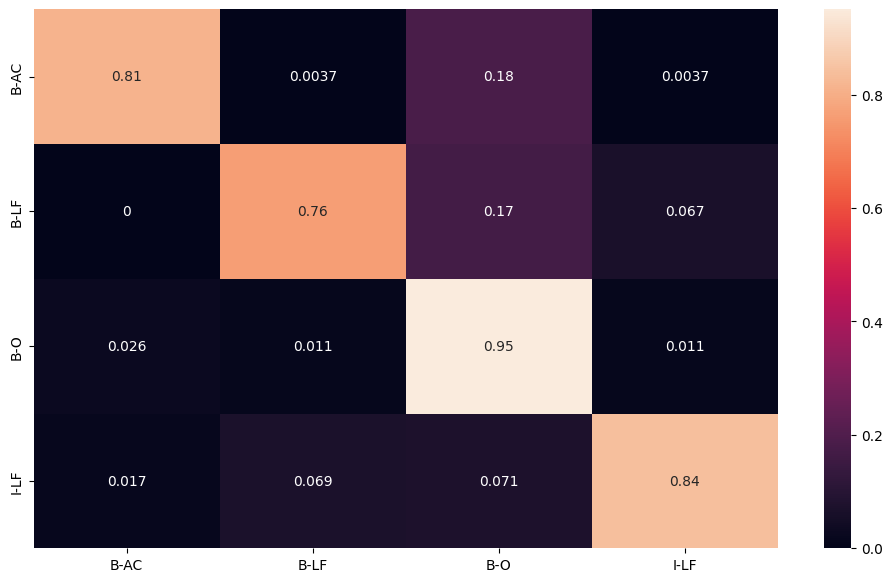

In [2]:
from datasets import load_dataset
import os

model_root_path = "./models"
model_prefix = "model"
initial_model_path = os.path.join(model_root_path, "bert_model")
config_path = "./config/config.json"

# Get directories that match the model prefix pattern
dirs = sorted([d for d in os.listdir(model_root_path) if os.path.isdir(os.path.join(model_root_path, d)) and d.startswith(model_prefix)])

if dirs:
    last_model = dirs[-1]
    try:
        last_model_index = int(last_model.split("_")[-1])
    except ValueError:
        last_model_index = 0
else:
    last_model_index = 0
    last_model = None

# New training data
dataset = load_dataset("surrey-nlp/PLOD-CW")

# Your model codes
def create_model():
    classes = sorted(set(label for labels in dataset["train"]["ner_tags"] for label in labels))
    id2label = {str(i): label for i, label in enumerate(classes)}
    label2id = {v: k for k, v in id2label.items()}
    
    if last_model:
        tokenizer = AutoTokenizer.from_pretrained(f"{model_root_path}/{last_model}", add_prefix_space=True)
        model = AutoModelForTokenClassification.from_pretrained(f"{model_root_path}/{last_model}", id2label=id2label, label2id=label2id)
    else:
        tokenizer = AutoTokenizer.from_pretrained(initial_model_path, add_prefix_space=True)
        model = AutoModelForTokenClassification.from_pretrained(initial_model_path, id2label=id2label, label2id=label2id)

    args = TrainingArguments(
        f"{model_root_path}/{model_prefix}_{last_model_index + 1}/outputs",
        report_to="tensorboard",
        logging_dir="logs",
        load_best_model_at_end=True,
        evaluation_strategy='steps',
        save_steps=500,
        save_total_limit=5,
        logging_strategy='steps',
        eval_steps=500,
        learning_rate=2e-5,
        per_device_train_batch_size=4,
        per_device_eval_batch_size=4,
        num_train_epochs=1,
        weight_decay=0.001,
        metric_for_best_model='f1'
    )
    data_collator = DataCollatorForTokenClassification(tokenizer)
    return model, tokenizer, data_collator, args

# Run the pipeline
pipeline = NLP()
trainer = pipeline.fit(dataset, create_model)
new_model_path = f"{model_root_path}/{model_prefix}_{last_model_index + 1}"
trainer.save_model(new_model_path)
#trainer.save_model(f"{model_root_path}/{model_prefix}_{last_model_index + 1}")

# Update the config file with the new model path
with open(config_path, 'r') as config_file:
    config = json.load(config_file)

config["MODEL_NAME"] = new_model_path

with open(config_path, 'w') as config_file:
    json.dump(config, config_file, indent=4)

## Testing model for individual input.

In [ ]:
import torch
from transformers import AutoTokenizer, AutoModelForTokenClassification, pipeline

def load_model(model_name: str):
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    tokenizer = AutoTokenizer.from_pretrained(model_name)

    classes = ['B-AC', 'B-LF', 'B-O', 'I-LF']
    id2label = {i: label for i, label in enumerate(classes)}
    label2id = {v: k for k, v in id2label.items()}
    
    model = AutoModelForTokenClassification.from_pretrained(
        model_name, id2label=id2label, label2id=label2id
    )
    model.to(device)
    
    return model, tokenizer

def test_model(model, tokenizer, input_sentence: str):
    # Use the pipeline to predict entities
    pipe = pipeline("ner", model=model, tokenizer=tokenizer, aggregation_strategy="first")
    result = pipe(input_sentence)
    print(f"Raw Result: {result}")
    print(input_sentence)

    # Flatten the list of lists
    flattened_result = [item for sublist in result for item in (sublist if isinstance(sublist, list) else [sublist])]

    try:
        formatted_results = [{"label": res["entity_group"], "word": res["word"], "score": res["score"]} for res in flattened_result]
    except Exception as e:
        print(f"Error in formatting results: {e}")
        return []
    
    return formatted_results

In [ ]:

model_name = "./models/model_3"  # Adjust the path to your trained model
model, tokenizer = load_model(model_name)

input_sentence = "Abbreviations: GEMS, Global Enteric Multicenter Study; VIP, ventilated improved pit."
try:
    predictions = test_model(model, tokenizer, input_sentence)
    for prediction in predictions:
        print(prediction)
except Exception as e:
    print(f"Error during model prediction: {e}")

# Test with another sentence
input_sentence = "For this purpose the Gothenburg Young Persons Empowerment Scale (GYPES) was developed."
try:
    predictions = test_model(model, tokenizer, input_sentence)
    for prediction in predictions:
        print(prediction)
except Exception as e:
    print(f"Error during model prediction: {e}")